In [ ]:
! pip install -q kaggle

In [ ]:
from google.colab import files
files.upload()

In [ ]:
! mkdir ~/.kaggle

In [ ]:
! cp kaggle.json ~/.kaggle/

In [ ]:
! chmod 600 ~/.kaggle/kaggle.json

chmod: cannot access '/root/.kaggle/kaggle.json': No such file or directory


In [ ]:
! kaggle datasets list

ref                                                      title                                     size  lastUpdated          downloadCount  voteCount  usabilityRating  
-------------------------------------------------------  ---------------------------------------  -----  -------------------  -------------  ---------  ---------------  
themrityunjaypathak/covid-cases-and-deaths-worldwide     Covid Cases and Deaths WorldWide           8KB  2023-02-01 12:22:51          13067        446  1.0              
datascientistanna/customers-dataset                      Shop Customer Data                        23KB  2023-02-07 18:42:21          11280        256  1.0              
ulrikthygepedersen/co2-emissions-by-country              CO2 Emissions                            114KB  2023-02-28 12:39:49           1264         33  1.0              
amaanansari09/most-streamed-songs-all-time               Most Streamed Songs (All Time)             8KB  2023-03-08 10:56:24           1575         47

In [ ]:
! kaggle datasets download -d yasserh/breast-cancer-dataset

  0% 0.00/48.6k [00:00<?, ?B/s]
100% 48.6k/48.6k [00:00<00:00, 33.5MB/s]


In [ ]:
! mkdir train

In [ ]:
! unzip breast-cancer-dataset.zip -d train

Archive:  breast-cancer-dataset.zip
  inflating: train/breast-cancer.csv  


In [ ]:
from google.colab import drive 
drive.mount('/content/gdrive')

Mounted at /content/gdrive


## **Initializing the libraries**

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

## **Pre - Processing**

In [ ]:
# M - Malignant   B - Banign
df = pd.read_csv('/content/train/breast-cancer.csv')
df.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 32 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             5

In [ ]:
df.isnull().sum()

id                         0
diagnosis                  0
radius_mean                0
texture_mean               0
perimeter_mean             0
area_mean                  0
smoothness_mean            0
compactness_mean           0
concavity_mean             0
concave points_mean        0
symmetry_mean              0
fractal_dimension_mean     0
radius_se                  0
texture_se                 0
perimeter_se               0
area_se                    0
smoothness_se              0
compactness_se             0
concavity_se               0
concave points_se          0
symmetry_se                0
fractal_dimension_se       0
radius_worst               0
texture_worst              0
perimeter_worst            0
area_worst                 0
smoothness_worst           0
compactness_worst          0
concavity_worst            0
concave points_worst       0
symmetry_worst             0
fractal_dimension_worst    0
dtype: int64

In [ ]:
df.drop(columns = 'id',axis = 1,inplace =True)

In [ ]:
df.replace({'diagnosis':{'M':1, 'B':0}}, inplace= True)
df.tail()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
564,1,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,...,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,1,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,...,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,1,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,...,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,1,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,...,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400
568,0,7.76,24.54,47.92,181.0,0.05263,0.04362,0.00000,0.00000,0.1587,...,9.456,30.37,59.16,268.6,0.08996,0.06444,0.0000,0.0000,0.2871,0.07039


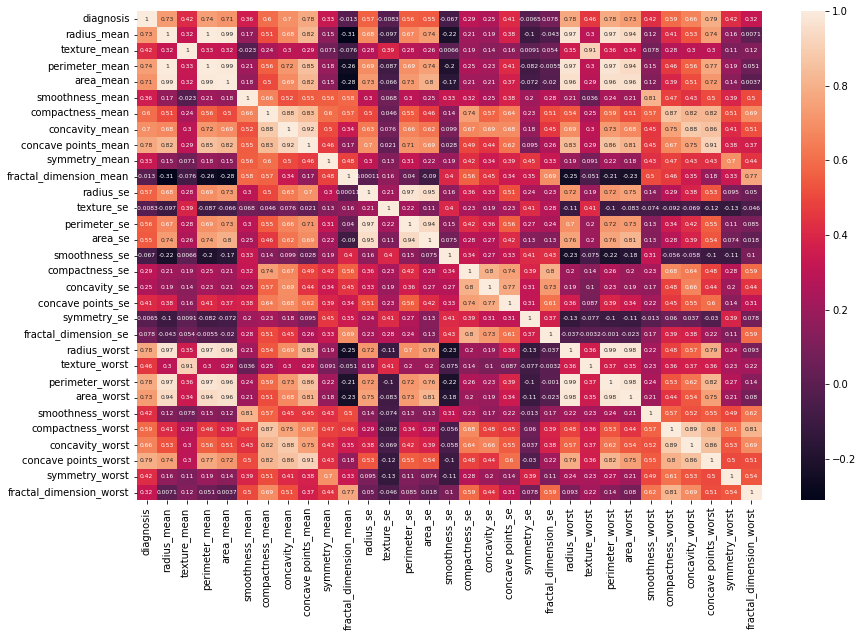

In [ ]:
# Id is not Important For Prediction 
#the graph is showing the relation of features with each other
import seaborn as sns
plt.figure(figsize=(14,9))
sns.heatmap(df.corr(),annot=True,annot_kws={"size":6})
plt.show()

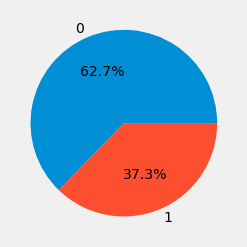

In [ ]:
# pichart to show the frequency of each class label
bm=df['diagnosis'].value_counts()
plt.style.use("fivethirtyeight")
plt.pie(bm.values,labels=bm.index,autopct="%1.1f%%")
plt.show()

In [ ]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
diagnosis,569.0,0.372583,0.483918,0.000000,0.000000,0.000000,1.000000,1.00000
radius_mean,569.0,14.127292,3.524049,6.981000,11.700000,13.370000,15.780000,28.11000
texture_mean,569.0,19.289649,4.301036,9.710000,16.170000,18.840000,21.800000,39.28000
perimeter_mean,569.0,91.969033,24.298981,43.790000,75.170000,86.240000,104.100000,188.50000
area_mean,569.0,654.889104,351.914129,143.500000,420.300000,551.100000,782.700000,2501.00000
smoothness_mean,569.0,0.096360,0.014064,0.052630,0.086370,0.095870,0.105300,0.16340
compactness_mean,569.0,0.104341,0.052813,0.019380,0.064920,0.092630,0.130400,0.34540
concavity_mean,569.0,0.088799,0.079720,0.000000,0.029560,0.061540,0.130700,0.42680
concave points_mean,569.0,0.048919,0.038803,0.000000,0.020310,0.033500,0.074000,0.20120
symmetry_mean,569.0,0.181162,0.027414,0.106000,0.161900,0.179200,0.195700,0.30400


In [ ]:
# y represents class label 
y = df.iloc[:,0].values
# X represents features or columns 
X = df.iloc[:,1:].values


#toy dataset
# import sklearn
# import sklearn.datasets
# np.random.seed(0)
# X, y = sklearn.datasets.make_moons(200, noise=0.20)
# X,y

In [ ]:
df.sort_values(by = 'diagnosis',ascending=0)

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,1,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,...,25.380,17.33,184.60,2019.0,0.16220,0.66560,0.71190,0.26540,0.4601,0.11890
210,1,20.58,22.14,134.70,1290.0,0.09090,0.13480,0.16400,0.09561,0.1765,...,23.240,27.84,158.30,1656.0,0.11780,0.29200,0.38610,0.19200,0.2909,0.05865
190,1,14.22,23.12,94.37,609.9,0.10750,0.24130,0.19810,0.06618,0.2384,...,15.740,37.18,106.40,762.4,0.15330,0.93270,0.84880,0.17720,0.5166,0.14460
193,1,12.34,26.86,81.15,477.4,0.10340,0.13530,0.10850,0.04562,0.1943,...,15.650,39.34,101.70,768.9,0.17850,0.47060,0.44250,0.14590,0.3215,0.12050
194,1,14.86,23.21,100.40,671.4,0.10440,0.19800,0.16970,0.08878,0.1737,...,16.080,27.78,118.60,784.7,0.13160,0.46480,0.45890,0.17270,0.3000,0.08701
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
271,0,11.29,13.04,72.23,388.0,0.09834,0.07608,0.03265,0.02755,0.1769,...,12.320,16.18,78.27,457.5,0.13580,0.15070,0.12750,0.08750,0.2733,0.08022
270,0,14.29,16.82,90.30,632.6,0.06429,0.02675,0.00725,0.00625,0.1508,...,14.910,20.65,94.44,684.6,0.08567,0.05036,0.03866,0.03333,0.2458,0.06120
269,0,10.71,20.39,69.50,344.9,0.10820,0.12890,0.08448,0.02867,0.1668,...,11.690,25.21,76.51,410.4,0.13350,0.25500,0.25340,0.08600,0.2605,0.08701
268,0,12.87,16.21,82.38,512.2,0.09425,0.06219,0.03900,0.01615,0.2010,...,13.900,23.64,89.27,597.5,0.12560,0.18080,0.19920,0.05780,0.3604,0.07062


In [ ]:
# M = 357 entries , B = 212 entries 
df.iloc[:,0].value_counts()

0    357
1    212
Name: diagnosis, dtype: int64

## **Relation Between Features**

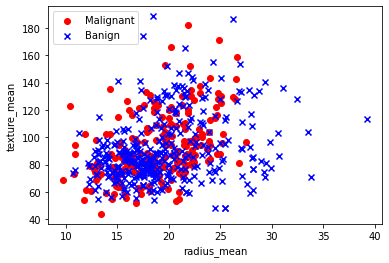

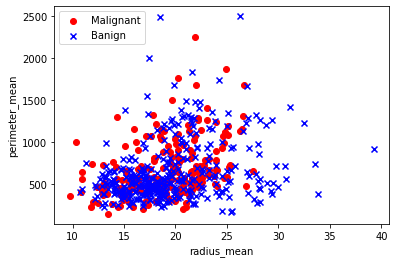

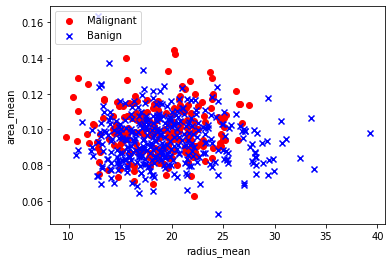

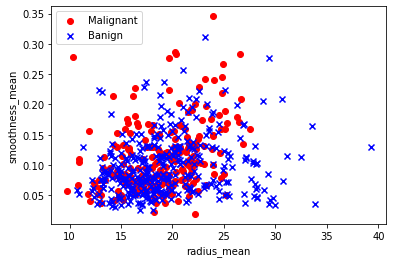

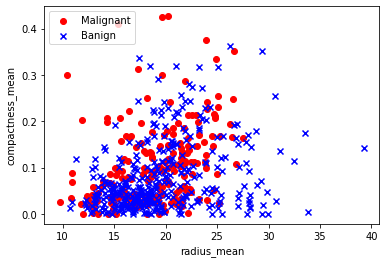

...

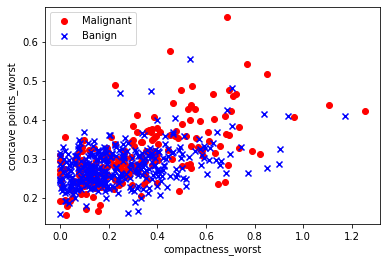

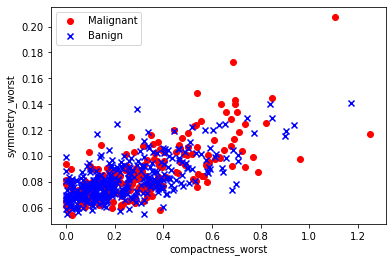

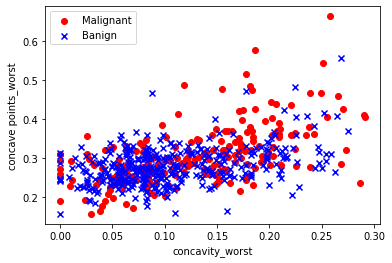

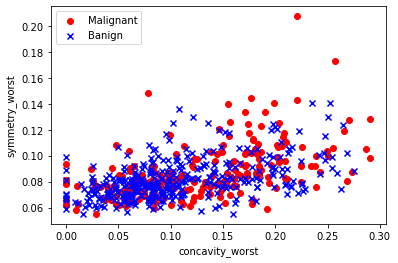

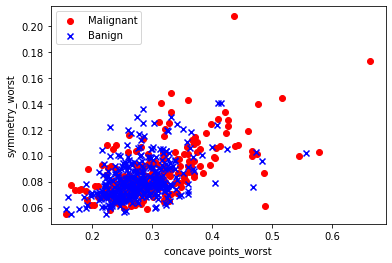

In [ ]:
#  plot data
for i in range(1,29):
  for j in range(i+1,30):
    plt.scatter(X[:212,i], X[:212, j],color='red', marker='o', label='Malignant')
    plt.scatter(X[212:569, i], X[212:569, j],color='blue', marker='x', label='Banign')
    plt.xlabel(df.columns[i])
    plt.ylabel(df.columns[j])
    plt.legend(loc='upper left')
    plt.show()
    print()

# plt.scatter(X[:,0], X[:,1], s=40, c=y, cmap=plt.cm.Spectral)

In [ ]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test = train_test_split(X,y,test_size=0.3,stratify=y,random_state=41)
print(x_train.shape,y_train.shape,x_test.shape,y_test.shape)

(398, 30) (398,) (171, 30) (171,)


## **Modelling**

In [ ]:
import random

class Network(object):

    def __init__(self, nn_layers):
        self.num_layers = len(nn_layers)
        self.nn_layers = nn_layers
        self.biases = [np.random.randn(y, 1) for y in nn_layers[1:]]
        self.weights = [np.random.randn(y, x)
                        for x, y in zip(nn_layers[:-1], nn_layers[1:])]

    def feedforward(self, a):
        for b, w in zip(self.biases, self.weights):
            a = sigmoid(np.dot(w, a)+b)
        return a

    def build_model(self, X,y, batch_size,epochs,eta,test_data=False):
      if not test_data: 
        for j in range(epochs):
          mini_X = [X[k:k+batch_size,:] for k in range(0, len(X), batch_size)]
          mini_y = [y[k:k+batch_size] for k in range(0, len(y), batch_size)]
          for X_,y_ in zip(mini_X,mini_y):
            self.update_params(X_,y_, eta)
          print ("Epoch {0}: {1}".format(j, self.predict(X,y)))

      else:
        print("test accuracy {0}".format(self.predict(X,y)))


    def update_params(self,X,y, eta):
        nabla_b = [np.zeros(b.shape) for b in self.biases]
        nabla_w = [np.zeros(w.shape) for w in self.weights]
        for x,y in zip(X,y):
            delta_nabla_b, delta_nabla_w = self.backprop(x,y)
            nabla_b = [nb+dnb for nb, dnb in zip(nabla_b, delta_nabla_b)]
            nabla_w = [nw+dnw for nw, dnw in zip(nabla_w, delta_nabla_w)]
        self.weights = [w-(eta)*nw
                        for w, nw in zip(self.weights, nabla_w)]
        self.biases = [b-(eta)*nb
                       for b, nb in zip(self.biases, nabla_b)]

    def backprop(self, x, y):
        nabla_b = [np.zeros(b.shape) for b in self.biases]
        nabla_w = [np.zeros(w.shape) for w in self.weights]
        # feedforward
        activation = x
        activations = [x] # list to store all the activations, layer by layer
        zs = [] # list to store all the z vectors, layer by layer
        for b, w in zip(self.biases, self.weights):
            z = np.dot(w, activation)+ b
            zs.append(np.diag(z))
            activation = sigmoid(np.diag(z))
            activations.append(activation)

        # backward pass
        #error
        delta = self.cost_derivative(activations[-1], y) * sigmoid_prime(zs[-1])
        nabla_b[-1] = delta
        nabla_w[-1] = (activations[-2] * delta)
        for l in range(2, self.num_layers):
            z = zs[-l]
            sp = sigmoid_prime(z)
            delta = np.dot(self.weights[-l+1].transpose(), delta) * sp
            nabla_b[-l] = delta
            nabla_w[-l] = activations[l-1].transpose().dot(delta)
        return (nabla_b, nabla_w)

    def predict(self, X,y):
        test_results = [(np.argmax(self.feedforward(x)), y)
                        for (x, y) in zip(X,y)]
        return sum(int(x == y) for (x, y) in test_results) / len(y) * 100

    def cost_derivative(self, output_activations, y):
        return (output_activations-y)
      
def sigmoid(z):
    """The sigmoid function."""
    return 1.0/(1.0+np.exp(-z))

def sigmoid_prime(z):
    """Derivative of the sigmoid function."""
    return sigmoid(z)*(1-sigmoid(z))

In [ ]:
# 1 Input Layer(len(X - columns) inputs) , 1 output layer(1 neuron = ouputs -> 1/0)
two_layer_model = [len(X[0]),1]
# 1 Input Layer(len(X - columns) inputs) , 1 Hidden layer(3 neurons), 1 output layer(1 neuron = ouputs -> 1/0)
three_layer_model = [len(X[0]),2,1]
print("no hidden layer,no back propogation i.e 30 -> 1")
network = Network(two_layer_model)
network.build_model(x_train,y_train,30,1,0.01)
network.predict(x_train,y_train)

print("1 hidden layer with 3 neurons i.e 30 -> 3 -> 1")
network2 = Network(three_layer_model)
network2.build_model(x_train,y_train,30,30,0.01)




no hidden layer,no back propogation i.e 30 -> 1
Epoch 0: 62.8140703517588
1 hidden layer with 3 neurons i.e 30 -> 3 -> 1
Epoch 0: 62.8140703517588
Epoch 1: 62.8140703517588
Epoch 2: 62.8140703517588
Epoch 3: 62.8140703517588
Epoch 4: 62.8140703517588
Epoch 5: 62.8140703517588
Epoch 6: 62.8140703517588
Epoch 7: 62.8140703517588
Epoch 8: 62.8140703517588
Epoch 9: 62.8140703517588
Epoch 10: 62.8140703517588
Epoch 11: 62.8140703517588
Epoch 12: 62.8140703517588
Epoch 13: 62.8140703517588
Epoch 14: 62.8140703517588
Epoch 15: 62.8140703517588
Epoch 16: 62.8140703517588
Epoch 17: 62.8140703517588
Epoch 18: 62.8140703517588
Epoch 19: 62.8140703517588
Epoch 20: 62.8140703517588
Epoch 21: 62.8140703517588
Epoch 22: 62.8140703517588
Epoch 23: 62.8140703517588
Epoch 24: 62.8140703517588
Epoch 25: 62.8140703517588
Epoch 26: 62.8140703517588
Epoch 27: 62.8140703517588
Epoch 28: 62.8140703517588
Epoch 29: 62.8140703517588


## **Testing**



In [ ]:

network2.build_model(x_test,y_test,0,0,0,True)

test accuracy 35.67251461988304
